# Medical pipeline

Clean main notebook. Reusable definitions were moved to `301_pipeline_support_functions.ipynb`.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython.display import display, Markdown
import pydicom
import torch

In [2]:
%run ./301_pipeline_config.ipynb
%run ./301_pipeline_support_functions.ipynb


Pipeline config loaded.


In [3]:
BASE_DIR = Path("/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesis_lumbar_spine_degeneration_classification")
DATA_DIR = BASE_DIR / "BC-data" / "data-rsna2024"

TRAIN_IMAGES_DIR = DATA_DIR / "train_images"

LOCALIZATION_DIR = BASE_DIR / "Localization-baseline"
CLASSIFICATION_DIR = BASE_DIR / "Classification-baseline"
warnings.filterwarnings("ignore")

ROOT = Path("/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesis_lumbar_spine_degeneration_classification")
DATA_ROOT = ROOT / "BC-data"
PROJECT_ROOT = ROOT / "Classification-baseline"
DATA_CSV = DATA_ROOT / "data-rsna2024" / "data_merged.csv"
MODEL_ROOT = PROJECT_ROOT / "models"

os.chdir(ROOT)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
%run ./Classification-baseline/100_class_support_functions.ipynb

## Load the study id

In [4]:
data_merged = pd.read_csv(DATA_DIR / "data_merged.csv")

data_merged["study_id"] = data_merged["study_id"].astype(str)
data_merged["series_id"] = data_merged["series_id"].astype(str)

data_merged.shape

(48677, 15)

In [5]:
if "plane" not in data_merged.columns:
    data_merged["plane"] = data_merged["series_description"].apply(infer_plane)

In [6]:
# Reproduce original GroupShuffleSplit: 70 / 15 / 15 by study_id

gss = GroupShuffleSplit(n_splits=1, train_size=0.70, random_state=42)
train_idx, temp_idx = next(gss.split(data_merged, groups=data_merged["study_id"]))

train_df = data_merged.iloc[train_idx].copy()
temp_df = data_merged.iloc[temp_idx].copy()

gss = GroupShuffleSplit(n_splits=1, train_size=0.50, random_state=42)
val_idx, test_idx = next(gss.split(temp_df, groups=temp_df["study_id"]))

val_df = temp_df.iloc[val_idx].copy()
test_df = temp_df.iloc[test_idx].copy()

print(train_df.shape, val_df.shape, test_df.shape)
print(train_df.study_id.nunique(), val_df.study_id.nunique(), test_df.study_id.nunique())

(34077, 16) (7277, 16) (7323, 16)
1381 296 297


In [7]:
# Pick one test study with both sagittal and axial series

study_summary = (
    test_df
    .groupby("study_id")["plane"]
    .apply(lambda x: set(x))
)

candidate_studies = [
    study_id for study_id, planes in study_summary.items()
    if {"Sagittal", "Axial"}.issubset(planes)
]

STUDY_ID = candidate_studies[0]
study_df = test_df[test_df["study_id"].eq(STUDY_ID)].copy()

print("Selected study:", STUDY_ID)
display(
    study_df[["study_id", "series_id", "series_description", "plane"]]
    .drop_duplicates()
)

Selected study: 1004726367


,study_id,series_id,series_description,plane
11294,1004726367,992525108,Axial T2,Axial
11304,1004726367,1709080005,Sagittal T2/STIR,Sagittal
11309,1004726367,2526352865,Sagittal T1,Sagittal


## Retrieve all the slices

In [8]:
TRAIN_IMAGES_DIR = DATA_DIR / "train_images"

study_image_dir = TRAIN_IMAGES_DIR / str(STUDY_ID)

all_image_paths = sorted(study_image_dir.glob("*/*.dcm"))

study_slices = pd.DataFrame({
    "img_path": [str(p) for p in all_image_paths],
    "study_id": [p.parts[-3] for p in all_image_paths],
    "series_id": [p.parts[-2] for p in all_image_paths],
    "slice_number": [int(p.stem) for p in all_image_paths],
})

study_slices = study_slices.sort_values(
    ["study_id", "series_id", "slice_number"]
).reset_index(drop=True)

print("Number of DICOM slices:", len(study_slices))
display(study_slices.head())

Number of DICOM slices: 79


,img_path,study_id,series_id,slice_number
0,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,1
1,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,2
2,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,3
3,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,4
4,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,5


In [9]:
series_info = (
    study_df[["study_id", "series_id", "series_description", "plane"]]
    .drop_duplicates()
)

study_slices = study_slices.merge(
    series_info,
    on=["study_id", "series_id"],
    how="left",
)

display(
    study_slices
    .groupby(["series_id", "series_description", "plane"])
    .size()
    .reset_index(name="n_slices")
)

,series_id,series_description,plane,n_slices
0,1709080005,Sagittal T2/STIR,Sagittal,18
1,2526352865,Sagittal T1,Sagittal,18
2,992525108,Axial T2,Axial,43


In [10]:
study_slices["slice_rank"] = (
    study_slices
    .groupby("series_id")
    .cumcount() + 1
)

study_slices["n_slices"] = (
    study_slices
    .groupby("series_id")["slice_rank"]
    .transform("max")
)

study_slices["rel_slice"] = (
    (study_slices["slice_rank"] - 1)
    / (study_slices["n_slices"] - 1).clip(lower=1)
)

display(study_slices.head(10))

,img_path,study_id,series_id,slice_number,series_description,plane,slice_rank,n_slices,rel_slice
0,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,1,Sagittal T2/STIR,Sagittal,1,18,0.000000
1,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,2,Sagittal T2/STIR,Sagittal,2,18,0.058824
2,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,3,Sagittal T2/STIR,Sagittal,3,18,0.117647
3,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,4,Sagittal T2/STIR,Sagittal,4,18,0.176471
4,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,5,Sagittal T2/STIR,Sagittal,5,18,0.235294
5,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,6,Sagittal T2/STIR,Sagittal,6,18,0.294118
6,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,7,Sagittal T2/STIR,Sagittal,7,18,0.352941
7,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,8,Sagittal T2/STIR,Sagittal,8,18,0.411765
8,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,9,Sagittal T2/STIR,Sagittal,9,18,0.470588
9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,10,Sagittal T2/STIR,Sagittal,10,18,0.529412


## Estimate the levels

In [11]:
sag_t2_series = (
    study_slices[
        study_slices["series_description"].astype(str).str.contains("Sagittal T2/STIR", case=False, na=False)
    ][["study_id", "series_id", "series_description"]]
    .drop_duplicates()
)

display(sag_t2_series)

SAG_T2_SERIES_ID = sag_t2_series["series_id"].iloc[0]
print("Selected Sagittal T2/STIR series:", SAG_T2_SERIES_ID)

,study_id,series_id,series_description
0,1004726367,1709080005,Sagittal T2/STIR


Selected Sagittal T2/STIR series: 1709080005


In [12]:
sag_t2_df = study_slices[
    study_slices["series_description"]
    .astype(str)
    .str.contains("Sagittal T2/STIR", case=False, na=False)
].copy()

SAG_T2_SERIES_ID = sag_t2_df["series_id"].iloc[0]

sag_t2_series_df = sag_t2_df[
    sag_t2_df["series_id"].eq(SAG_T2_SERIES_ID)
].copy()

print("Selected series:", SAG_T2_SERIES_ID)
print("Number of slices:", len(sag_t2_series_df))

Selected series: 1709080005
Number of slices: 18


In [13]:
VNET_CKPT = BASE_DIR / "Localization-baseline/models/vnet_3d_canal_localization/best_vnet3d_canal_localization.pt"

vnet_model = load_vnet_checkpoint(VNET_CKPT, vnet_cfg)

vol, meta = load_series_volume(sag_t2_series_df, vnet_cfg)

vnet_level_df, vnet_probs, y_profiles = predict_vnet_levels(
    vnet_model,
    vol,
    meta,
    vnet_cfg,
)

vnet_level_df["study_id"] = STUDY_ID
vnet_level_df["series_id"] = SAG_T2_SERIES_ID

display(vnet_level_df)

,level,level_idx,pred_y_resized,pred_y_original,confidence,study_id,series_id
0,L1/L2,0,60,105.176471,0.999183,1004726367,1709080005
1,L2/L3,1,94,164.776471,0.999067,1004726367,1709080005
2,L3/L4,2,128,224.376471,0.999054,1004726367,1709080005
3,L4/L5,3,161,282.223529,0.999584,1004726367,1709080005
4,L5/S1,4,196,343.576471,0.999201,1004726367,1709080005


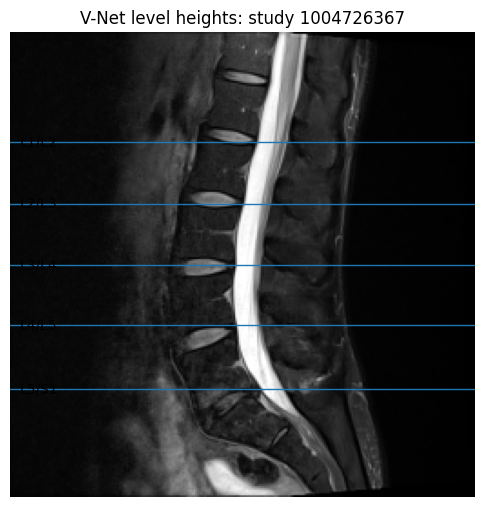

In [14]:
mid_slice = vol.shape[0] // 2

plt.figure(figsize=(6, 8))
plt.imshow(vol[mid_slice], cmap="gray")

for _, row in vnet_level_df.iterrows():
    y = row["pred_y_resized"]
    plt.axhline(y, linewidth=1)
    plt.text(5, y, row["level"], va="center", fontsize=10)

plt.title(f"V-Net level heights: study {STUDY_ID}")
plt.axis("off")
plt.show()

In [15]:
geom_df = pd.DataFrame([
    get_slice_geometry(p)
    for p in study_slices["img_path"]
])

study_geom = study_slices.merge(geom_df, on="img_path", how="left")
study_geom.head()

,img_path,study_id,series_id,slice_number,series_description,plane,slice_rank,n_slices,rel_slice,ipp_x,...,col_x,col_y,col_z,normal_x,normal_y,normal_z,pixel_spacing_0,pixel_spacing_1,rows,cols
0,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,1,Sagittal T2/STIR,Sagittal,1,18,0.000000,-38.004043,...,-0.008599,0.005227,-0.999949,-0.999963,-0.001035,0.008593,0.535714,0.535714,448,448
1,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,2,Sagittal T2/STIR,Sagittal,2,18,0.058824,-33.524212,...,-0.008599,0.005227,-0.999949,-0.999963,-0.001035,0.008593,0.535714,0.535714,448,448
2,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,3,Sagittal T2/STIR,Sagittal,3,18,0.117647,-29.044378,...,-0.008599,0.005227,-0.999949,-0.999963,-0.001035,0.008593,0.535714,0.535714,448,448
3,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,4,Sagittal T2/STIR,Sagittal,4,18,0.176471,-24.564546,...,-0.008599,0.005227,-0.999949,-0.999963,-0.001035,0.008593,0.535714,0.535714,448,448
4,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,1004726367,1709080005,5,Sagittal T2/STIR,Sagittal,5,18,0.235294,-20.084715,...,-0.008599,0.005227,-0.999949,-0.999963,-0.001035,0.008593,0.535714,0.535714,448,448


In [16]:
sag_selected_df = select_sagittal_slices(study_df, study_geom)

display(
    sag_selected_df[
        [
            "study_id",
            "series_id",
            "series_description",
            "condition",
            "level",
            "selector_task",
            "selected_center_rank",
            "selected_n_slices",
            "selected_img_path_center",
        ]
    ]
)

,study_id,series_id,series_description,condition,level,selector_task,selected_center_rank,selected_n_slices,selected_img_path_center
0,1004726367,1709080005,Sagittal T2/STIR,Spinal Canal Stenosis,L1/L2,spinal_canal,9,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
1,1004726367,1709080005,Sagittal T2/STIR,Spinal Canal Stenosis,L2/L3,spinal_canal,9,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
2,1004726367,1709080005,Sagittal T2/STIR,Spinal Canal Stenosis,L3/L4,spinal_canal,9,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
3,1004726367,1709080005,Sagittal T2/STIR,Spinal Canal Stenosis,L4/L5,spinal_canal,9,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
4,1004726367,1709080005,Sagittal T2/STIR,Spinal Canal Stenosis,L5/S1,spinal_canal,9,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
5,1004726367,2526352865,Sagittal T1,Right Neural Foraminal Narrowing,L4/L5,right_foraminal,14,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
6,1004726367,2526352865,Sagittal T1,Right Neural Foraminal Narrowing,L5/S1,right_foraminal,14,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
7,1004726367,2526352865,Sagittal T1,Right Neural Foraminal Narrowing,L3/L4,right_foraminal,14,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
8,1004726367,2526352865,Sagittal T1,Right Neural Foraminal Narrowing,L1/L2,right_foraminal,13,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
9,1004726367,2526352865,Sagittal T1,Right Neural Foraminal Narrowing,L2/L3,right_foraminal,14,18,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...


In [17]:
sag_t2_geom = study_geom[
    study_geom["series_id"].astype(str).eq(str(SAG_T2_SERIES_ID))
].sort_values("slice_rank")

center_sag_row = sag_t2_geom.iloc[len(sag_t2_geom) // 2]

level_points = []

for _, row in vnet_level_df.iterrows():
    x = center_sag_row["cols"] / 2
    y = row["pred_y_original"]

    pt = pixel_to_patient_3d(center_sag_row, x=x, y=y)

    level_points.append({
        "study_id": STUDY_ID,
        "level": row["level"],
        "pt_x": pt[0],
        "pt_y": pt[1],
        "pt_z": pt[2],
        "level_confidence": row["confidence"],
    })

vnet_points_df = pd.DataFrame(level_points)

display(vnet_points_df)

,study_id,level,pt_x,pt_y,pt_z,level_confidence
0,1004726367,L1/L2,1.711141,66.601305,-459.504563,0.999183
1,1004726367,L2/L3,1.436596,66.768198,-491.431516,0.999067
2,1004726367,L3/L4,1.162051,66.935090,-523.358470,0.999054
3,1004726367,L4/L5,0.895581,67.097075,-554.346396,0.999584
4,1004726367,L5/S1,0.612961,67.268876,-587.212378,0.999201


In [18]:
ax_selected_df = select_axial_slices_from_vnet(
    study_df=study_df,
    study_geom=study_geom,
    vnet_points_df=vnet_points_df,
)

display(
    ax_selected_df[
        [
            "study_id",
            "series_id",
            "series_description",
            "condition",
            "level",
            "selected_center_rank",
            "selected_n_slices",
            "nearest_plane_distance_mm",
            "selected_img_path_center",
        ]
    ]
)

,study_id,series_id,series_description,condition,level,selected_center_rank,selected_n_slices,nearest_plane_distance_mm,selected_img_path_center
0,1004726367,992525108,Axial T2,Right Subarticular Stenosis,L1/L2,5,43,0.071069,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
1,1004726367,992525108,Axial T2,Left Subarticular Stenosis,L1/L2,5,43,0.071069,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
2,1004726367,992525108,Axial T2,Left Subarticular Stenosis,L2/L3,13,43,0.985864,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
3,1004726367,992525108,Axial T2,Right Subarticular Stenosis,L2/L3,13,43,0.985864,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
4,1004726367,992525108,Axial T2,Left Subarticular Stenosis,L3/L4,22,43,1.726823,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
5,1004726367,992525108,Axial T2,Right Subarticular Stenosis,L3/L4,22,43,1.726823,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
6,1004726367,992525108,Axial T2,Left Subarticular Stenosis,L4/L5,29,43,0.873557,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
7,1004726367,992525108,Axial T2,Right Subarticular Stenosis,L4/L5,29,43,0.873557,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
8,1004726367,992525108,Axial T2,Left Subarticular Stenosis,L5/S1,38,43,0.885689,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...
9,1004726367,992525108,Axial T2,Right Subarticular Stenosis,L5/S1,38,43,0.885689,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...


In [19]:
selected_slices_df = pd.concat(
    [
        sag_selected_df.assign(selection_source="sagittal_distribution"),
        ax_selected_df.assign(selection_source="axial_vnet_level_point"),
    ],
    ignore_index=True,
)

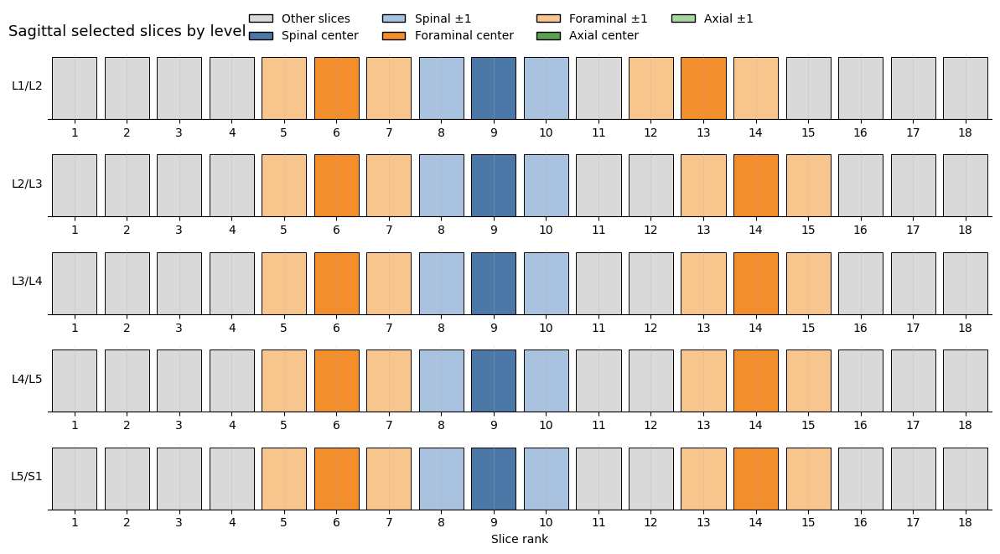

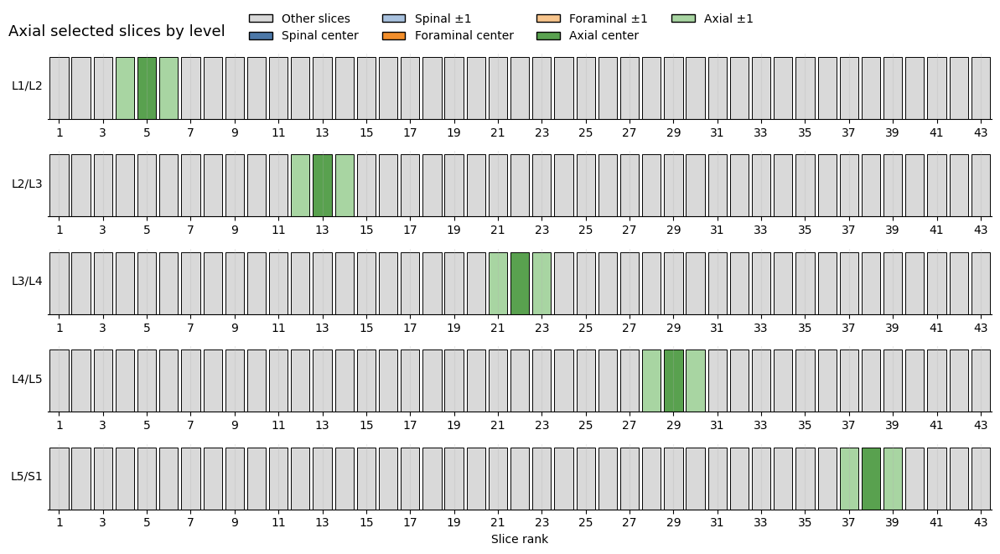

In [20]:
plot_slice_selection_panel(
    sag_selected_df,
    title="Sagittal selected slices by level",
    default_type="foraminal",
)
plot_slice_selection_panel(
    ax_selected_df,
    title="Axial selected slices by level",
    default_type="axial",
)

## Predict the raw heatmaps 

In [21]:
import nbformat

MODELS_NOTEBOOK = BASE_DIR / "Localization-baseline" / "202_vertebra_localization_models.ipynb"
%run "$MODELS_NOTEBOOK"

In [22]:
SAG_UNET_CKPT = BASE_DIR / "Localization-baseline/models/spinal_vertebra_localization/best_unet_no_aug.pt"
AX_UNET_CKPT = BASE_DIR / "Localization-baseline/models/spinal_axial_localization/best_unet_no_aug.pt"  # change if axial model is elsewhere

sag_unet = load_unet(SAG_UNET_CKPT, n_targets=len(LEVEL_ORDER))
ax_unet = load_unet(AX_UNET_CKPT, n_targets=len(SIDES))

print("sag_unet loaded")
print("ax_unet loaded")

sag_unet loaded
ax_unet loaded


### Sagittal level coordinates

In [23]:
sag_geom = study_geom[
    study_geom["series_id"].astype(str).eq(str(SAG_T2_SERIES_ID))
].copy()

sag_geom = sag_geom.sort_values("slice_rank")

sag_center_rank = int(round(sag_geom["n_slices"].iloc[0] / 2))

sag_stack, sag_ds, sag_img_path = load_25d_stack(
    series_geom=sag_geom,
    center_rank=sag_center_rank,
)

sag_raw_pred_df = predict_raw_unet(
    model=sag_unet,
    stack=sag_stack,
    targets=LEVEL_ORDER,
)

sag_raw_pred_df["study_id"] = STUDY_ID
sag_raw_pred_df["series_id"] = SAG_T2_SERIES_ID
sag_raw_pred_df["slice_rank"] = sag_center_rank
sag_raw_pred_df["img_path"] = sag_img_path

sag_raw_pred_df["pred_x"] = sag_raw_pred_df["pred_x_resized"] / (IMG_SIZE - 1) * (sag_ds.Columns - 1)
sag_raw_pred_df["pred_y"] = sag_raw_pred_df["pred_y_resized"] / (IMG_SIZE - 1) * (sag_ds.Rows - 1)

display(sag_raw_pred_df)

,target,target_idx,pred_x_resized,pred_y_resized,raw_confidence,study_id,series_id,slice_rank,img_path,pred_x,pred_y
0,L1/L2,0,152,27,1.000000,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,266.447059,47.329412
1,L2/L3,1,144,59,1.000000,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,252.423529,103.423529
2,L3/L4,2,132,129,0.989799,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,231.388235,226.129412
3,L4/L5,3,132,163,0.999858,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,231.388235,285.729412
4,L5/S1,4,140,193,0.999943,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,245.411765,338.317647


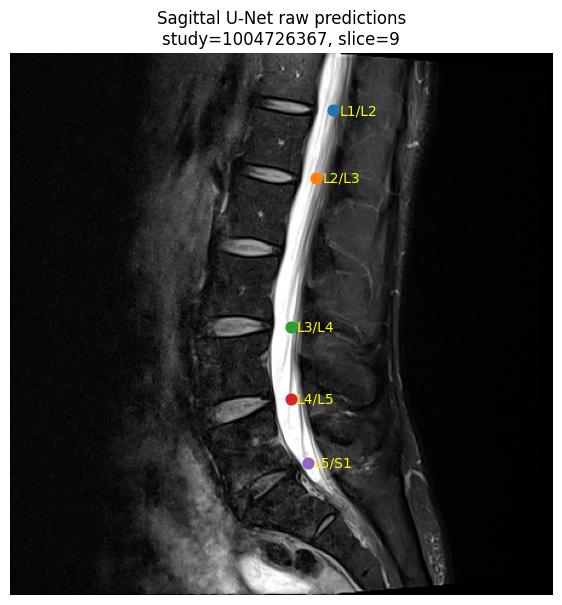

In [24]:
sag_img, _ = read_dicom(sag_img_path)

plt.figure(figsize=(7, 9))
plt.imshow(sag_img, cmap="gray")

for _, row in sag_raw_pred_df.iterrows():
    plt.scatter(row["pred_x"], row["pred_y"], s=60)
    plt.text(
        row["pred_x"] + 5,
        row["pred_y"],
        row["target"],
        color="yellow",
        fontsize=10,
        va="center",
    )

plt.title(f"Sagittal U-Net raw predictions\nstudy={STUDY_ID}, slice={sag_center_rank}")
plt.axis("off")
plt.show()

In [25]:
ax_selected_unique_df = (
    ax_selected_df
    .drop_duplicates(["series_id", "level", "selected_center_rank"])
    .reset_index(drop=True)
)

ax_preds = []

for _, row in ax_selected_unique_df.iterrows():
    series_id = str(row["series_id"])
    center_rank = int(row["selected_center_rank"])

    ax_geom = study_geom[
        study_geom["series_id"].astype(str).eq(series_id)
    ].sort_values("slice_rank")

    ax_stack, ax_ds, ax_img_path = load_25d_stack(
        ax_geom,
        center_rank=center_rank,
    )

    pred_df = predict_raw_unet(
        model=ax_unet,
        stack=ax_stack,
        targets=SIDES,
    )

    pred_df["study_id"] = STUDY_ID
    pred_df["series_id"] = series_id
    pred_df["level"] = row["level"]
    pred_df["slice_rank"] = center_rank
    pred_df["img_path"] = ax_img_path

    pred_df["pred_x"] = pred_df["pred_x_resized"] / (IMG_SIZE - 1) * (ax_ds.Columns - 1)
    pred_df["pred_y"] = pred_df["pred_y_resized"] / (IMG_SIZE - 1) * (ax_ds.Rows - 1)

    ax_preds.append(pred_df)

ax_raw_pred_df = pd.concat(ax_preds, ignore_index=True)

display(ax_raw_pred_df)

,target,target_idx,pred_x_resized,pred_y_resized,raw_confidence,study_id,series_id,level,slice_rank,img_path,pred_x,pred_y
0,Left,0,153,135,0.852651,1004726367,992525108,L1/L2,5,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,191.400000,168.882353
1,Right,1,120,133,0.965577,1004726367,992525108,L1/L2,5,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,150.117647,166.380392
2,Left,0,151,135,0.962978,1004726367,992525108,L2/L3,13,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,188.898039,168.882353
3,Right,1,122,133,0.977254,1004726367,992525108,L2/L3,13,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,152.619608,166.380392
4,Left,0,150,128,0.991841,1004726367,992525108,L3/L4,22,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,187.647059,160.125490
5,Right,1,120,129,0.995744,1004726367,992525108,L3/L4,22,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,150.117647,161.376471
6,Left,0,146,121,0.985232,1004726367,992525108,L4/L5,29,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,182.643137,151.368627
7,Right,1,116,120,0.975501,1004726367,992525108,L4/L5,29,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,145.113725,150.117647
8,Left,0,144,119,0.880824,1004726367,992525108,L5/S1,38,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,180.141176,148.866667
9,Right,1,122,118,0.886046,1004726367,992525108,L5/S1,38,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,152.619608,147.615686


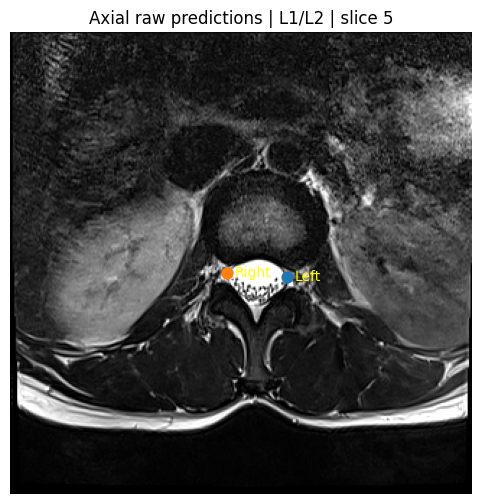

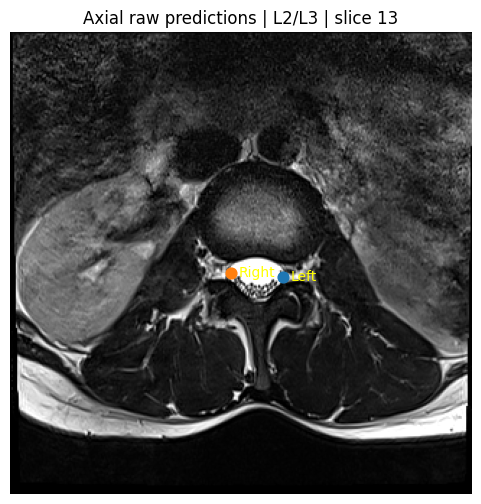

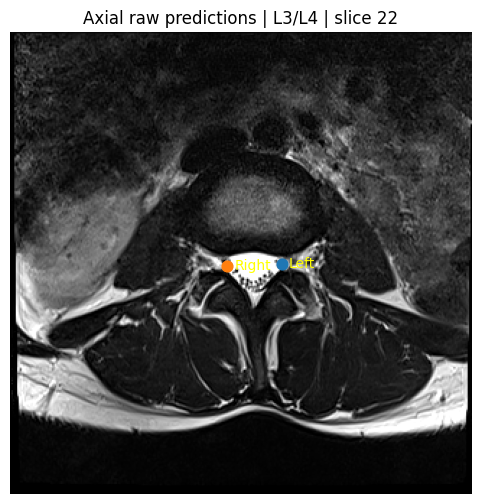

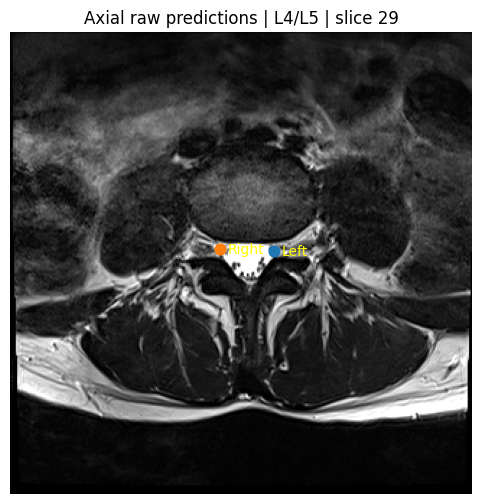

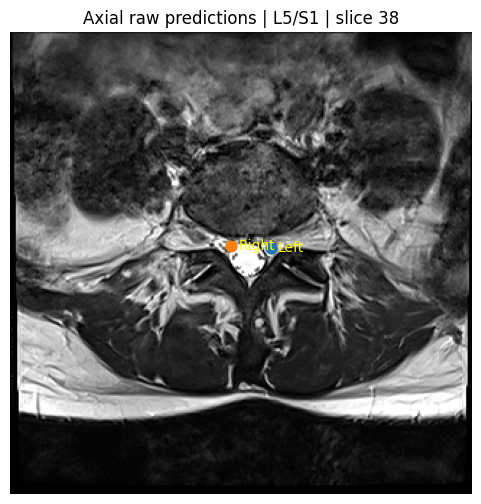

In [26]:
for (series_id, level, slice_rank), d in ax_raw_pred_df.groupby(["series_id", "level", "slice_rank"]):
    img_path = d["img_path"].iloc[0]
    img, _ = read_dicom(img_path)

    plt.figure(figsize=(6, 6))
    plt.imshow(img, cmap="gray")

    for _, row in d.iterrows():
        plt.scatter(row["pred_x"], row["pred_y"], s=60)
        plt.text(
            row["pred_x"] + 5,
            row["pred_y"],
            row["target"],
            color="yellow",
            fontsize=10,
            va="center",
        )

    plt.title(f"Axial raw predictions | {level} | slice {slice_rank}")
    plt.axis("off")
    plt.show()

### Prior maps 

In [27]:
PRIOR_DIR = BASE_DIR / "Localization-baseline" / "prior_maps"

SAG_PRIORS = np.load(PRIOR_DIR / "sag_priors.npy")
AX_PRIORS = np.load(PRIOR_DIR / "ax_priors.npy")

print(SAG_PRIORS.shape, AX_PRIORS.shape)

(5, 256, 256) (2, 256, 256)


In [28]:
sag_corrected_df = predict_unet_with_prior(
    model=sag_unet,
    stack=sag_stack,
    targets=LEVEL_ORDER,
    priors=SAG_PRIORS,
)

# Level-order correction: enforce L1/L2 -> L5/S1 by vertical order
sag_corrected_df = sag_corrected_df.sort_values("pred_y_resized").reset_index(drop=True)
sag_corrected_df["target"] = LEVEL_ORDER
sag_corrected_df["target_idx"] = range(len(LEVEL_ORDER))

sag_corrected_df["study_id"] = STUDY_ID
sag_corrected_df["series_id"] = SAG_T2_SERIES_ID
sag_corrected_df["slice_rank"] = sag_center_rank
sag_corrected_df["img_path"] = sag_img_path

sag_corrected_df["pred_x"] = sag_corrected_df["pred_x_resized"] / (IMG_SIZE - 1) * (sag_ds.Columns - 1)
sag_corrected_df["pred_y"] = sag_corrected_df["pred_y_resized"] / (IMG_SIZE - 1) * (sag_ds.Rows - 1)

display(sag_corrected_df)

,target,target_idx,pred_x_resized,pred_y_resized,corrected_confidence,study_id,series_id,slice_rank,img_path,pred_x,pred_y
0,L1/L2,0,144.0,67.0,-0.074308,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,252.423529,117.447059
1,L2/L3,1,136.0,101.0,-0.037220,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,238.400000,177.047059
2,L3/L4,2,132.0,131.0,-0.041240,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,231.388235,229.635294
3,L4/L5,3,136.0,165.0,-0.010803,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,238.400000,289.235294
4,L5/S1,4,144.0,191.0,-0.000724,1004726367,1709080005,9,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,252.423529,334.811765


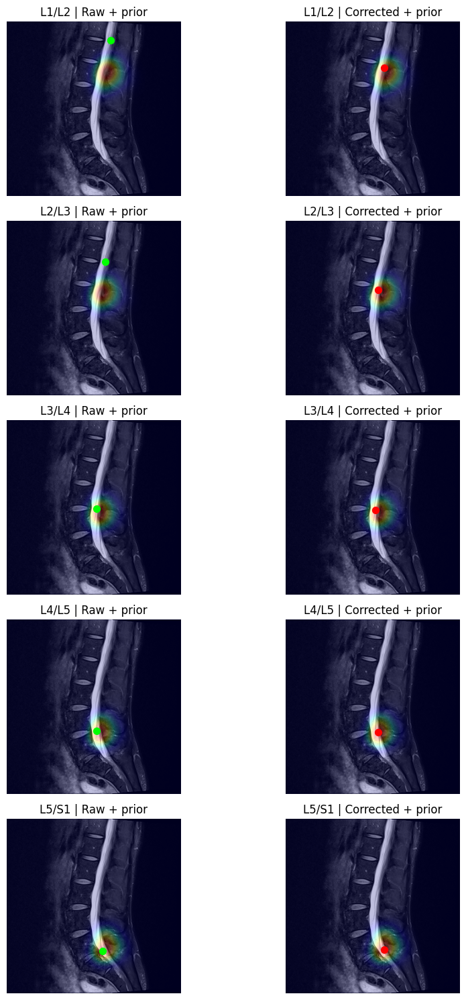

In [29]:
plot_sagittal_raw_vs_corrected(
    sag_img_path=sag_img_path,
    sag_raw_pred_df=sag_raw_pred_df,
    sag_corrected_df=sag_corrected_df,
    SAG_PRIORS=SAG_PRIORS,
)

In [30]:
ax_corrected = []

for _, row in ax_selected_unique_df.iterrows():
    series_id = str(row["series_id"])
    center_rank = int(row["selected_center_rank"])

    ax_geom = study_geom[
        study_geom["series_id"].astype(str).eq(series_id)
    ].sort_values("slice_rank")

    ax_stack, ax_ds, ax_img_path = load_25d_stack(
        ax_geom,
        center_rank=center_rank,
    )

    pred_df = predict_unet_with_prior(
        model=ax_unet,
        stack=ax_stack,
        targets=SIDES,
        priors=AX_PRIORS,
    )

    pred_df["study_id"] = STUDY_ID
    pred_df["series_id"] = series_id
    pred_df["level"] = row["level"]
    pred_df["slice_rank"] = center_rank
    pred_df["img_path"] = ax_img_path

    pred_df["pred_x"] = pred_df["pred_x_resized"] / (IMG_SIZE - 1) * (ax_ds.Columns - 1)
    pred_df["pred_y"] = pred_df["pred_y_resized"] / (IMG_SIZE - 1) * (ax_ds.Rows - 1)

    ax_corrected.append(pred_df)

ax_corrected_df = pd.concat(ax_corrected, ignore_index=True)

display(ax_corrected_df)

,target,target_idx,pred_x_resized,pred_y_resized,corrected_confidence,study_id,series_id,level,slice_rank,img_path,pred_x,pred_y
0,Left,0,153.0,135.0,-0.066215,1004726367,992525108,L1/L2,5,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,191.400000,168.882353
1,Right,1,120.0,133.0,-0.005536,1004726367,992525108,L1/L2,5,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,150.117647,166.380392
2,Left,0,151.0,134.0,-0.046074,1004726367,992525108,L2/L3,13,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,188.898039,167.631373
3,Right,1,122.0,133.0,-0.010258,1004726367,992525108,L2/L3,13,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,152.619608,166.380392
4,Left,0,150.0,129.0,-0.050556,1004726367,992525108,L3/L4,22,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,187.647059,161.376471
5,Right,1,120.0,130.0,-0.013470,1004726367,992525108,L3/L4,22,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,150.117647,162.627451
6,Left,0,146.0,123.0,-0.192472,1004726367,992525108,L4/L5,29,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,182.643137,153.870588
7,Right,1,119.0,123.0,-0.176816,1004726367,992525108,L4/L5,29,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,148.866667,153.870588
8,Left,0,145.0,120.0,-0.307547,1004726367,992525108,L5/S1,38,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,181.392157,150.117647
9,Right,1,122.0,118.0,-0.359956,1004726367,992525108,L5/S1,38,/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesi...,152.619608,147.615686


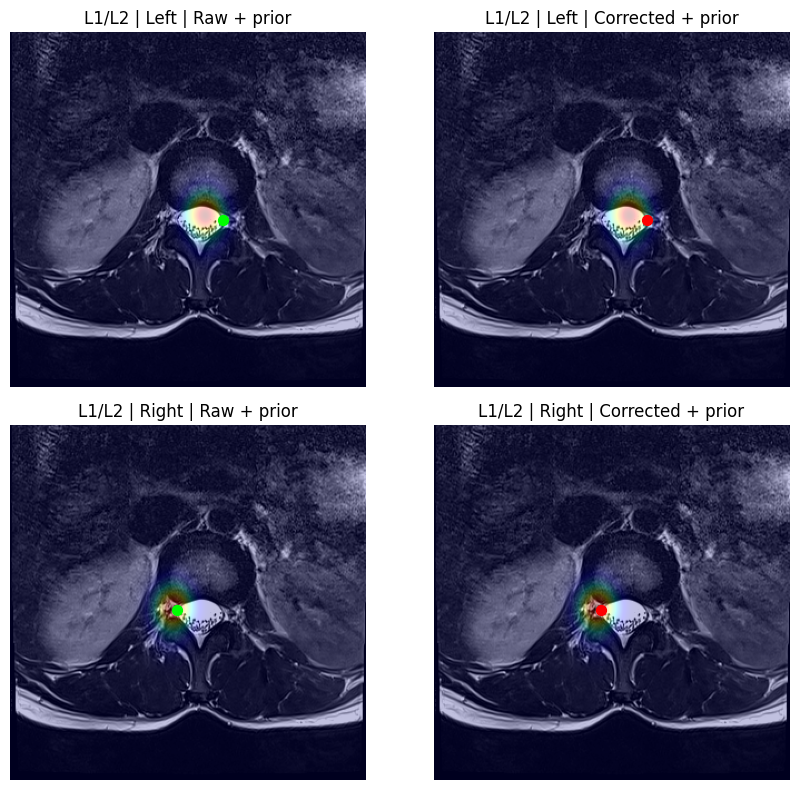

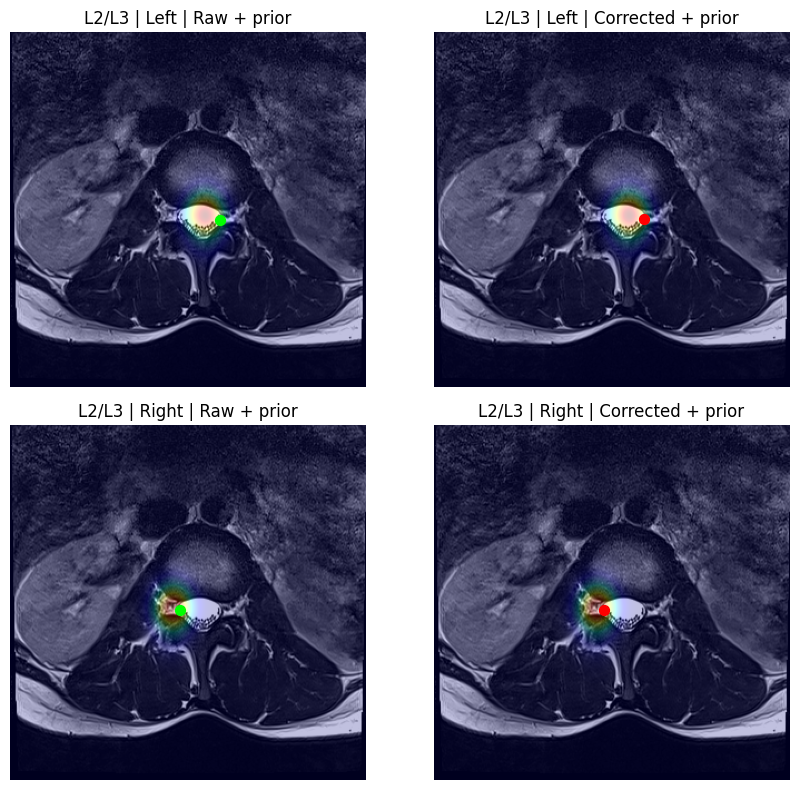

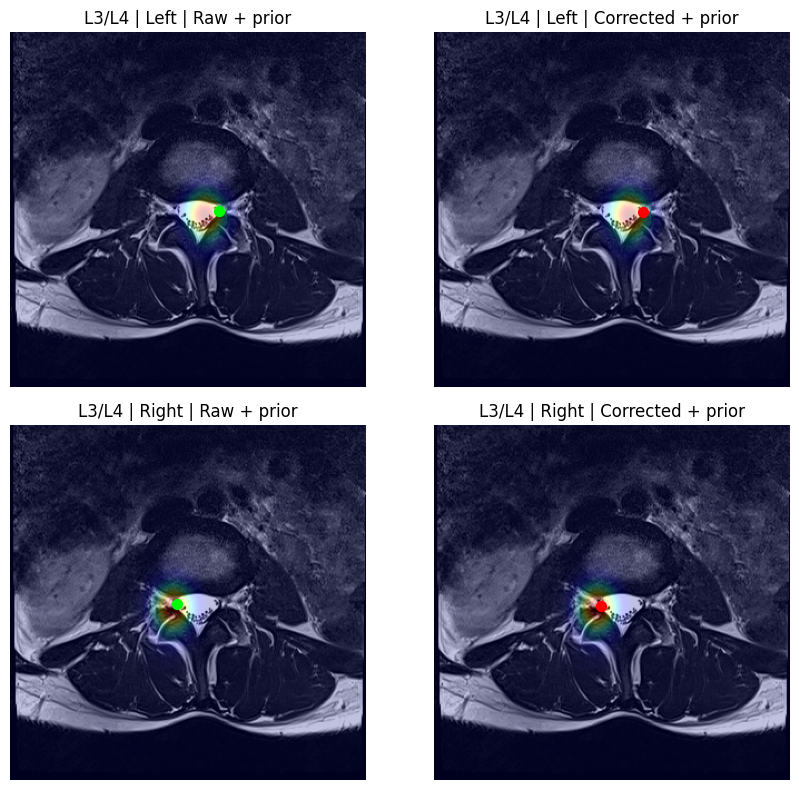

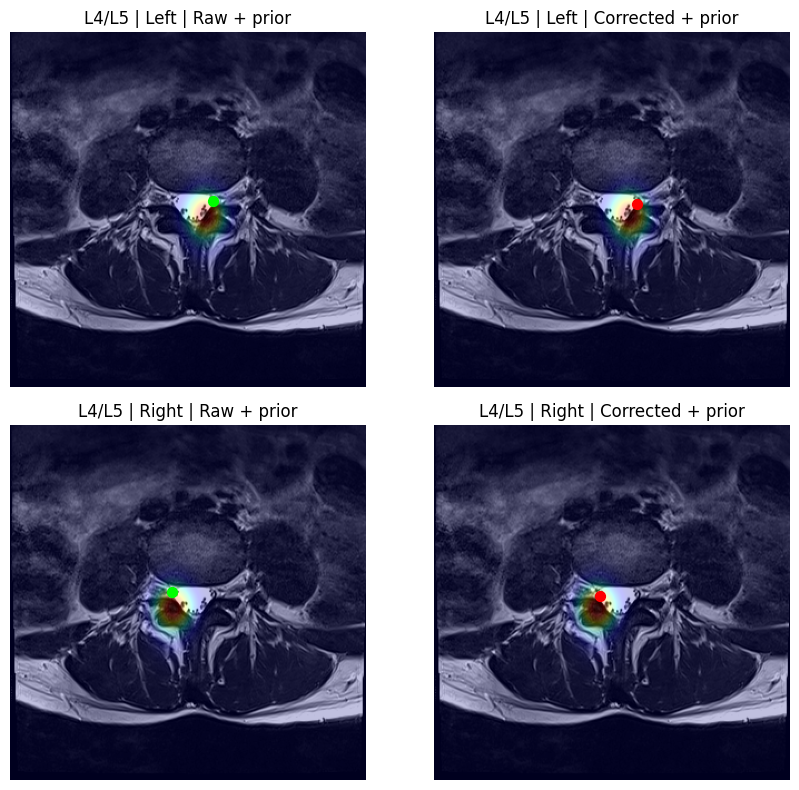

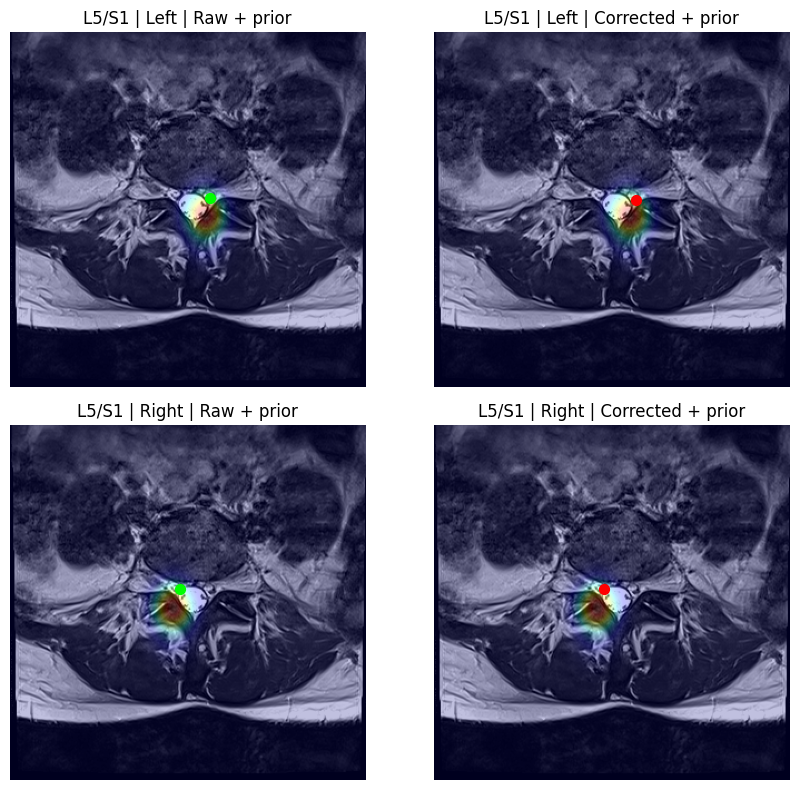

In [31]:
    
plot_axial_raw_vs_corrected(
    ax_raw_pred_df=ax_raw_pred_df,
    ax_corrected_df=ax_corrected_df,
    AX_PRIORS=AX_PRIORS,
)

## ROI crops

In [32]:
ROI_SIZE = 96

In [33]:
sag_cls_rows = []

for _, row in sag_selected_df.iterrows():
    level = row["level"]

    coord = sag_corrected_df[sag_corrected_df["target"].eq(level)].iloc[0]

    series_id = str(row["series_id"])
    center_rank = int(row["selected_center_rank"])

    series_geom = study_geom[
        study_geom["series_id"].astype(str).eq(series_id)
    ]

    stack = load_roi_25d(
        series_geom=series_geom,
        center_rank=center_rank,
        x=coord["pred_x"],
        y=coord["pred_y"],
        crop_size=ROI_SIZE,
    )

    sag_cls_rows.append({
        "study_id": STUDY_ID,
        "series_id": series_id,
        "series_description": row["series_description"],
        "plane": "Sagittal",
        "condition": row["condition"],
        "level": level,
        "side": None,
        "slice_rank": center_rank,
        "img_path": row["selected_img_path_center"],
        "x": coord["pred_x"],
        "y": coord["pred_y"],
        "roi_stack": stack,
    })

sag_cls_df = pd.DataFrame(sag_cls_rows)

display(
    sag_cls_df[
        ["study_id", "series_id", "series_description", "plane", "condition", "level", "slice_rank", "x", "y"]
    ]
)

,study_id,series_id,series_description,plane,condition,level,slice_rank,x,y
0,1004726367,1709080005,Sagittal T2/STIR,Sagittal,Spinal Canal Stenosis,L1/L2,9,252.423529,117.447059
1,1004726367,1709080005,Sagittal T2/STIR,Sagittal,Spinal Canal Stenosis,L2/L3,9,238.400000,177.047059
2,1004726367,1709080005,Sagittal T2/STIR,Sagittal,Spinal Canal Stenosis,L3/L4,9,231.388235,229.635294
3,1004726367,1709080005,Sagittal T2/STIR,Sagittal,Spinal Canal Stenosis,L4/L5,9,238.400000,289.235294
4,1004726367,1709080005,Sagittal T2/STIR,Sagittal,Spinal Canal Stenosis,L5/S1,9,252.423529,334.811765
5,1004726367,2526352865,Sagittal T1,Sagittal,Right Neural Foraminal Narrowing,L4/L5,14,238.400000,289.235294
6,1004726367,2526352865,Sagittal T1,Sagittal,Right Neural Foraminal Narrowing,L5/S1,14,252.423529,334.811765
7,1004726367,2526352865,Sagittal T1,Sagittal,Right Neural Foraminal Narrowing,L3/L4,14,231.388235,229.635294
8,1004726367,2526352865,Sagittal T1,Sagittal,Right Neural Foraminal Narrowing,L1/L2,13,252.423529,117.447059
9,1004726367,2526352865,Sagittal T1,Sagittal,Right Neural Foraminal Narrowing,L2/L3,14,238.400000,177.047059


In [34]:
ax_cls_rows = []

for _, row in ax_corrected_df.iterrows():
    series_id = str(row["series_id"])
    center_rank = int(row["slice_rank"])

    series_geom = study_geom[
        study_geom["series_id"].astype(str).eq(series_id)
    ]

    stack = load_roi_25d(
        series_geom=series_geom,
        center_rank=center_rank,
        x=row["pred_x"],
        y=row["pred_y"],
        crop_size=ROI_SIZE,
    )

    ax_cls_rows.append({
        "study_id": STUDY_ID,
        "series_id": series_id,
        "series_description": study_geom[study_geom["series_id"].astype(str).eq(series_id)]["series_description"].iloc[0],
        "plane": "Axial",
        "condition": f"{row['target']} Subarticular Stenosis",
        "level": row["level"],
        "side": row["target"],
        "slice_rank": center_rank,
        "img_path": row["img_path"],
        "x": row["pred_x"],
        "y": row["pred_y"],
        "roi_stack": stack,
    })

ax_cls_df = pd.DataFrame(ax_cls_rows)

display(
    ax_cls_df[
        ["study_id", "series_id", "series_description", "plane", "condition", "level", "side", "slice_rank", "x", "y"]
    ]
)

,study_id,series_id,series_description,plane,condition,level,side,slice_rank,x,y
0,1004726367,992525108,Axial T2,Axial,Left Subarticular Stenosis,L1/L2,Left,5,191.400000,168.882353
1,1004726367,992525108,Axial T2,Axial,Right Subarticular Stenosis,L1/L2,Right,5,150.117647,166.380392
2,1004726367,992525108,Axial T2,Axial,Left Subarticular Stenosis,L2/L3,Left,13,188.898039,167.631373
3,1004726367,992525108,Axial T2,Axial,Right Subarticular Stenosis,L2/L3,Right,13,152.619608,166.380392
4,1004726367,992525108,Axial T2,Axial,Left Subarticular Stenosis,L3/L4,Left,22,187.647059,161.376471
5,1004726367,992525108,Axial T2,Axial,Right Subarticular Stenosis,L3/L4,Right,22,150.117647,162.627451
6,1004726367,992525108,Axial T2,Axial,Left Subarticular Stenosis,L4/L5,Left,29,182.643137,153.870588
7,1004726367,992525108,Axial T2,Axial,Right Subarticular Stenosis,L4/L5,Right,29,148.866667,153.870588
8,1004726367,992525108,Axial T2,Axial,Left Subarticular Stenosis,L5/S1,Left,38,181.392157,150.117647
9,1004726367,992525108,Axial T2,Axial,Right Subarticular Stenosis,L5/S1,Right,38,152.619608,147.615686


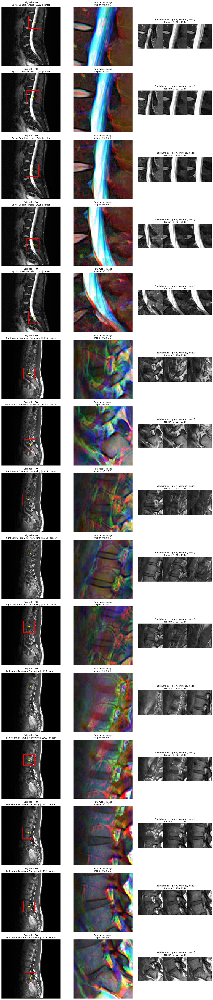

In [35]:
show_classification_roi_pipeline(sag_cls_df, n=25)

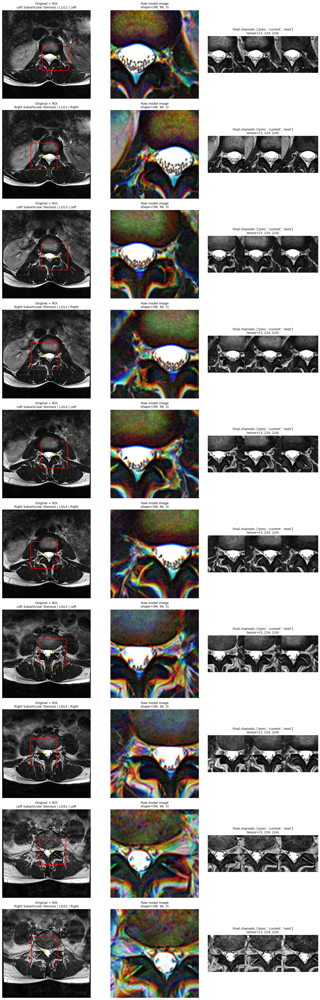

In [36]:
show_classification_roi_pipeline(ax_cls_df, n=25)

## Classification predictions

In [37]:
MODEL_NAMES = ["resnet34", "efficientnet_b0", "densenet169", "convnext_base", "swin_b"]

In [38]:
# ============================================================
# BASIC IMPORTS AND CONFIGURATION
# ============================================================
warnings.filterwarnings("ignore")

ROOT = Path("/home/jupyter-lukj08@vse.cz/VSE_bachelor_thesis_lumbar_spine_degeneration_classification")
DATA_ROOT = ROOT / "BC-data"
PROJECT_ROOT = ROOT / "Classification-baseline"
DATA_CSV = DATA_ROOT / "data-rsna2024" / "data_merged.csv"
MODEL_ROOT = PROJECT_ROOT / "models"

os.chdir(ROOT)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ------------------------------------------------------------
# Data settings: same as the training workflow
# ------------------------------------------------------------
IMAGE_SIZE = 224
BATCH_SIZE = 64

ROI_CROP_ENABLED = True
ROI_CROP_SIZE = 96
ROI_FALLBACK_TO_FULL_IMAGE = True
X_COLUMN = None
Y_COLUMN = None

USE_2_5D_INPUT = True
SLICE_CONTEXT_OFFSETS = (-1, 0, 1)
SERIES_GROUP_COLUMNS = None
SLICE_ORDER_COLUMN = None

NUM_WORKERS = 4
PIN_MEMORY = True
PERSISTENT_WORKERS = True
PREFETCH_FACTOR = 2

# ------------------------------------------------------------
# Model-head settings used by build_metadata_classifier(...)
# ------------------------------------------------------------
PRETRAINED = True
HIDDEN_DIM = 512
DROPOUT = 0.15

In [39]:
CONDITION_CONFIGS = {
    "neural_foraminal_narrowing": {
        "base_condition": "Neural Foraminal Narrowing",
        "series_description": "Sagittal T1",
    },
    "subarticular_stenosis": {
        "base_condition": "Subarticular Stenosis",
        "series_description": "Axial T2",
    },
    "spinal_canal_stenosis": {
        "base_condition": "Spinal Canal Stenosis",
        "series_description": "Sagittal T2/STIR",
    },
}

In [40]:
# ============================================================
# LABEL DEFINITIONS
# ============================================================

SEVERITY_MAP = {
    "Normal/Mild": 0,
    "Moderate": 1,
    "Severe": 2,
}

TARGET_NAMES = ["Normal/Mild", "Moderate", "Severe"]
N_CLASSES = len(TARGET_NAMES)

LEVELS = ["L1/L2", "L2/L3", "L3/L4", "L4/L5", "L5/S1"]

SIDE_TO_ID = {
    "center": 0,
    "left": 1,
    "right": 2,
}

SERIES_TO_ID = {
    "Sagittal T2/STIR": 0,
    "Sagittal T1": 1,
    "Axial T2": 2,
}

LEVEL_TO_ID = {level: idx for idx, level in enumerate(LEVELS)}

# CONDITION
CONDITION_KEYS = [
    "neural_foraminal_narrowing",
    "subarticular_stenosis",
    "spinal_canal_stenosis",
]
BASE_CONDITION = "Neural Foraminal Narrowing"
SERIES_DESCRIPTION = "Sagittal T1"

# Only the selected condition is used for mean/std and ensemble evaluation.
MODELS_TO_TRAIN = CONDITION_KEYS

In [43]:
cls_roi_df = pd.concat([sag_cls_df, ax_cls_df], ignore_index=True)
cls_roi_df = cls_roi_df.copy()

cls_roi_df["condition_key"] = cls_roi_df["condition"].apply(condition_to_key)
cls_roi_df["level_id"] = cls_roi_df["level"].map(LEVEL_TO_ID).astype(int)
cls_roi_df["side_name"] = cls_roi_df.apply(get_side, axis=1)
cls_roi_df["side_id"] = cls_roi_df["side_name"].map(SIDE_TO_ID).astype(int)
cls_roi_df["series_meta_id"] = cls_roi_df["series_description"].apply(get_series_id_for_model).astype(int)

In [44]:
all_pred_rows = []

for condition_key, cfg in CONDITION_CONFIGS.items():
    base_condition = cfg["base_condition"]
    series_description = cfg["series_description"]

    d = cls_roi_df[
        cls_roi_df["condition_key"].eq(condition_key)
        & cls_roi_df["series_description"].astype(str).str.contains(series_description, case=False, na=False)
    ].copy()

    if len(d) == 0:
        print("No ROI rows for:", condition_key)
        continue

    specs = get_model_specs(condition_key)

    print("\nCondition:", condition_key)
    print("Rows:", len(d))

    for model_name in MODEL_NAMES:
        spec = specs[model_name]

        print("  loading:", model_name)

        model = load_checkpoint_model(
            backbone_name=spec["backbone"],
            checkpoint_path=spec["checkpoint"],
        ).to(DEVICE)

        model.eval()

        for roi_idx, row in d.iterrows():
            pred = predict_single_roi(model, row)

            all_pred_rows.append({
                "roi_idx": roi_idx,
                "study_id": row["study_id"],
                "condition": row["condition"],
                "condition_key": condition_key,
                "base_condition": base_condition,
                "level": row["level"],
                "side": row["side_name"],
                "series_description": row["series_description"],
                "model": model_name,
                **pred,
            })

        del model
        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

model_pred_df = pd.DataFrame(all_pred_rows)

display(model_pred_df)


Condition: neural_foraminal_narrowing
Rows: 10
  loading: resnet34
  loading: efficientnet_b0
  loading: densenet169
  loading: convnext_base
  loading: swin_b

Condition: subarticular_stenosis
Rows: 10
  loading: resnet34
  loading: efficientnet_b0
  loading: densenet169
  loading: convnext_base
  loading: swin_b

Condition: spinal_canal_stenosis
Rows: 5
  loading: resnet34
  loading: efficientnet_b0
  loading: densenet169
  loading: convnext_base
  loading: swin_b


,roi_idx,study_id,condition,condition_key,base_condition,level,side,series_description,model,p0,p1,p2,pred_idx,pred_class,confidence
0,5,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,Neural Foraminal Narrowing,L4/L5,right,Sagittal T1,resnet34,0.688646,0.136472,0.174882,0,Normal/Mild,0.688646
1,6,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,Neural Foraminal Narrowing,L5/S1,right,Sagittal T1,resnet34,0.613093,0.159546,0.227362,0,Normal/Mild,0.613093
2,7,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,Neural Foraminal Narrowing,L3/L4,right,Sagittal T1,resnet34,0.748725,0.087664,0.163611,0,Normal/Mild,0.748725
3,8,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,Neural Foraminal Narrowing,L1/L2,right,Sagittal T1,resnet34,0.659437,0.166114,0.174449,0,Normal/Mild,0.659437
4,9,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,Neural Foraminal Narrowing,L2/L3,right,Sagittal T1,resnet34,0.698958,0.105486,0.195556,0,Normal/Mild,0.698958
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,0,1004726367,Spinal Canal Stenosis,spinal_canal_stenosis,Spinal Canal Stenosis,L1/L2,center,Sagittal T2/STIR,swin_b,0.752743,0.075678,0.171579,0,Normal/Mild,0.752743
121,1,1004726367,Spinal Canal Stenosis,spinal_canal_stenosis,Spinal Canal Stenosis,L2/L3,center,Sagittal T2/STIR,swin_b,0.730147,0.089476,0.180377,0,Normal/Mild,0.730147
122,2,1004726367,Spinal Canal Stenosis,spinal_canal_stenosis,Spinal Canal Stenosis,L3/L4,center,Sagittal T2/STIR,swin_b,0.735313,0.097075,0.167612,0,Normal/Mild,0.735313
123,3,1004726367,Spinal Canal Stenosis,spinal_canal_stenosis,Spinal Canal Stenosis,L4/L5,center,Sagittal T2/STIR,swin_b,0.676929,0.113529,0.209542,0,Normal/Mild,0.676929


In [45]:
TARGET_NAMES = ["Normal/Mild", "Moderate", "Severe"]

In [46]:
mean_ensemble_df = (
    model_pred_df
    .groupby(
        ["roi_idx", "study_id", "condition", "condition_key", "level", "side"],
        dropna=False,
    )[["p0", "p1", "p2"]]
    .mean()
    .reset_index()
)

mean_probs = mean_ensemble_df[["p0", "p1", "p2"]].values

mean_ensemble_df["mean_pred_idx"] = mean_probs.argmax(axis=1)
mean_ensemble_df["mean_pred_class"] = [
    TARGET_NAMES[i] for i in mean_ensemble_df["mean_pred_idx"]
]
mean_ensemble_df["mean_confidence"] = mean_probs.max(axis=1)

display(mean_ensemble_df)

,roi_idx,study_id,condition,condition_key,level,side,p0,p1,p2,mean_pred_idx,mean_pred_class,mean_confidence
0,0,1004726367,Spinal Canal Stenosis,spinal_canal_stenosis,L1/L2,center,0.718768,0.115378,0.165854,0,Normal/Mild,0.718768
1,1,1004726367,Spinal Canal Stenosis,spinal_canal_stenosis,L2/L3,center,0.675282,0.109764,0.214955,0,Normal/Mild,0.675282
2,2,1004726367,Spinal Canal Stenosis,spinal_canal_stenosis,L3/L4,center,0.681003,0.115615,0.203382,0,Normal/Mild,0.681003
3,3,1004726367,Spinal Canal Stenosis,spinal_canal_stenosis,L4/L5,center,0.604748,0.119569,0.275683,0,Normal/Mild,0.604748
4,4,1004726367,Spinal Canal Stenosis,spinal_canal_stenosis,L5/S1,center,0.657781,0.140465,0.201754,0,Normal/Mild,0.657781
5,5,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,L4/L5,right,0.621403,0.194020,0.184576,0,Normal/Mild,0.621403
6,6,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,L5/S1,right,0.496774,0.183819,0.319408,0,Normal/Mild,0.496774
7,7,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,L3/L4,right,0.557191,0.229459,0.213350,0,Normal/Mild,0.557191
8,8,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,L1/L2,right,0.720478,0.078401,0.201121,0,Normal/Mild,0.720478
9,9,1004726367,Right Neural Foraminal Narrowing,neural_foraminal_narrowing,L2/L3,right,0.686485,0.124028,0.189487,0,Normal/Mild,0.686485


In [47]:
safety_df = (
    model_pred_df
    .groupby("roi_idx", as_index=False)
    .agg(
        max_model_pred_idx=("pred_idx", "max"),
        max_model_p0=("p0", "max"),
        max_model_p1=("p1", "max"),
        max_model_p2=("p2", "max"),
    )
)

safety_df["max_model_pred_class"] = [
    TARGET_NAMES[i] for i in safety_df["max_model_pred_idx"]
]


In [48]:
final_ensemble_df = mean_ensemble_df.merge(
    safety_df[["roi_idx", "max_model_pred_idx", "max_model_pred_class"]],
    on="roi_idx",
    how="left",
)

final_ensemble_df["final_pred_idx"] = final_ensemble_df[
    ["mean_pred_idx", "max_model_pred_idx"]
].max(axis=1).astype(int)

final_ensemble_df["final_pred_class"] = [
    TARGET_NAMES[i] for i in final_ensemble_df["final_pred_idx"]
]

final_ensemble_df["safety_net_triggered"] = (
    final_ensemble_df["final_pred_idx"] > final_ensemble_df["mean_pred_idx"]
)

#display(final_ensemble_df)

# Explainability Report — Study `1004726367`

## 1. Series Overview


            **Number of series:** 3  
            **Number of DICOM images:** 79
            

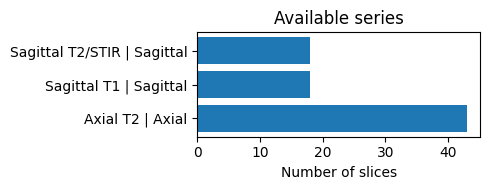

## 2. V-Net Sagittal Level Localization

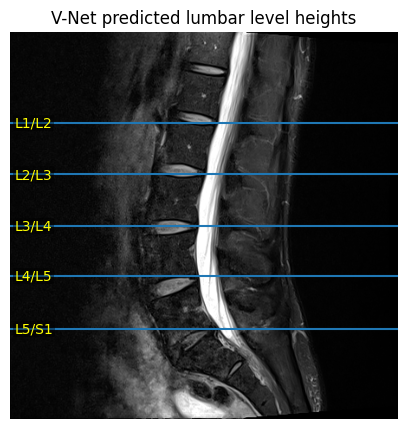

## 3. Selected Slices

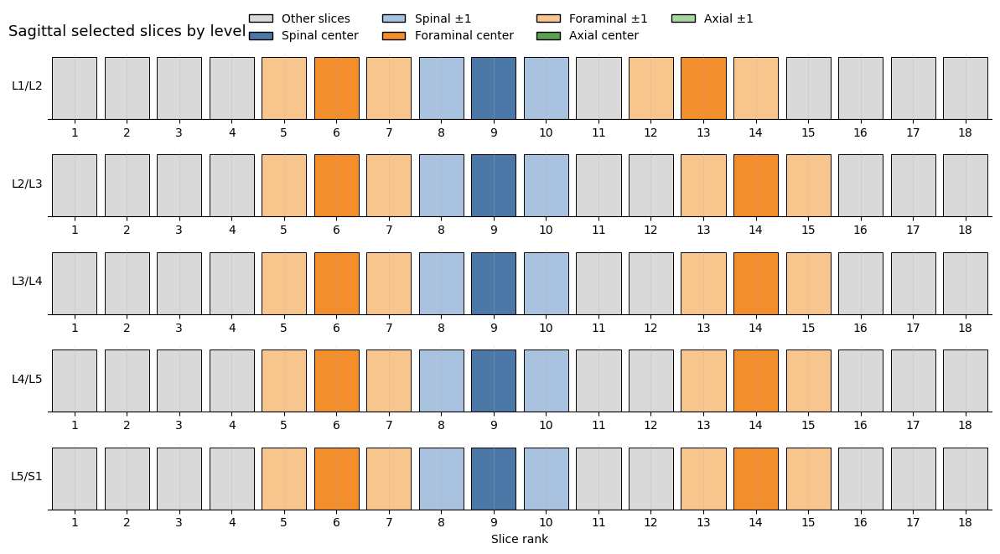

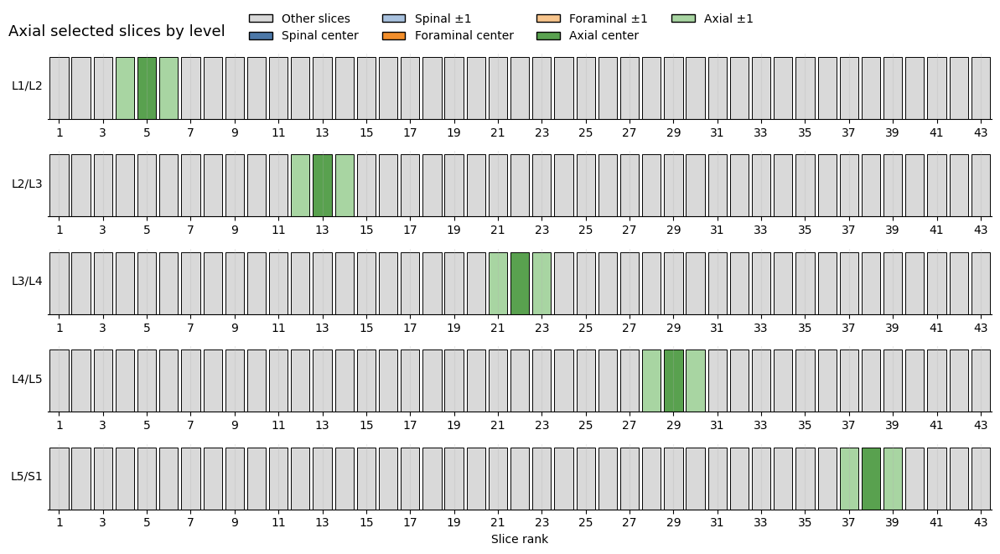

## 4. Sagittal Localization: Raw vs Corrected

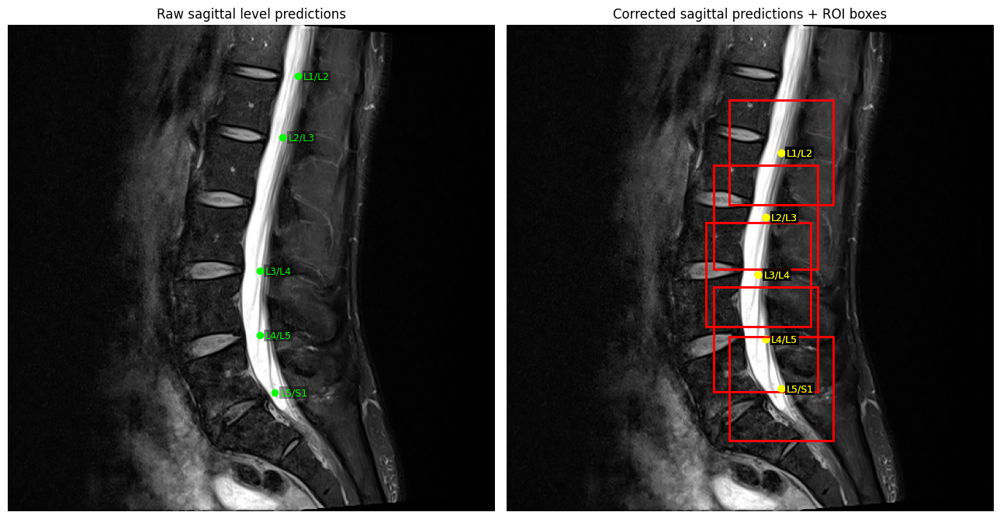

## 5. Axial Localization: Raw vs Corrected

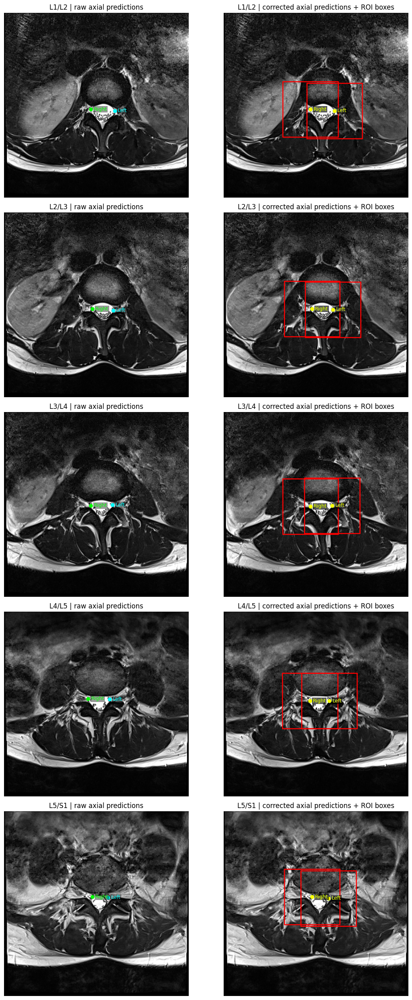

## 6. Model Predictions by Condition

### Spinal Canal Stenosis

,condition,level,side,convnext_base,densenet169,efficientnet_b0,resnet34,swin_b,mean_prediction,avg_p_normal_mild,avg_p_moderate,avg_p_severe
0,Spinal Canal Stenosis,L1/L2,center,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.719,0.115,0.166
1,Spinal Canal Stenosis,L2/L3,center,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.675,0.110,0.215
2,Spinal Canal Stenosis,L3/L4,center,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,0.681,0.116,0.203
3,Spinal Canal Stenosis,L4/L5,center,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,0.605,0.120,0.276
4,Spinal Canal Stenosis,L5/S1,center,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.658,0.140,0.202


### Right Neural Foraminal Narrowing

,condition,level,side,convnext_base,densenet169,efficientnet_b0,resnet34,swin_b,mean_prediction,avg_p_normal_mild,avg_p_moderate,avg_p_severe
8,Right Neural Foraminal Narrowing,L1/L2,right,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.720,0.078,0.201
9,Right Neural Foraminal Narrowing,L2/L3,right,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.686,0.124,0.189
7,Right Neural Foraminal Narrowing,L3/L4,right,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,0.557,0.229,0.213
5,Right Neural Foraminal Narrowing,L4/L5,right,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.621,0.194,0.185
6,Right Neural Foraminal Narrowing,L5/S1,right,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.497,0.184,0.319


### Left Neural Foraminal Narrowing

,condition,level,side,convnext_base,densenet169,efficientnet_b0,resnet34,swin_b,mean_prediction,avg_p_normal_mild,avg_p_moderate,avg_p_severe
10,Left Neural Foraminal Narrowing,L1/L2,left,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.719,0.087,0.193
11,Left Neural Foraminal Narrowing,L2/L3,left,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.762,0.053,0.185
12,Left Neural Foraminal Narrowing,L3/L4,left,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.680,0.108,0.212
13,Left Neural Foraminal Narrowing,L4/L5,left,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Moderate,Normal/Mild,0.452,0.356,0.192
14,Left Neural Foraminal Narrowing,L5/S1,left,Normal/Mild,Severe,Normal/Mild,Moderate,Moderate,Moderate,0.346,0.413,0.241


### Left Subarticular Stenosis

,condition,level,side,convnext_base,densenet169,efficientnet_b0,resnet34,swin_b,mean_prediction,avg_p_normal_mild,avg_p_moderate,avg_p_severe
15,Left Subarticular Stenosis,L1/L2,left,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.862,0.063,0.075
17,Left Subarticular Stenosis,L2/L3,left,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.823,0.087,0.091
19,Left Subarticular Stenosis,L3/L4,left,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.785,0.117,0.098
21,Left Subarticular Stenosis,L4/L5,left,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.789,0.118,0.093
23,Left Subarticular Stenosis,L5/S1,left,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.745,0.153,0.101


### Right Subarticular Stenosis

,condition,level,side,convnext_base,densenet169,efficientnet_b0,resnet34,swin_b,mean_prediction,avg_p_normal_mild,avg_p_moderate,avg_p_severe
16,Right Subarticular Stenosis,L1/L2,right,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.867,0.062,0.071
18,Right Subarticular Stenosis,L2/L3,right,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.855,0.074,0.071
20,Right Subarticular Stenosis,L3/L4,right,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.750,0.133,0.117
22,Right Subarticular Stenosis,L4/L5,right,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.739,0.159,0.102
24,Right Subarticular Stenosis,L5/S1,right,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,0.648,0.202,0.150


## 7. Final Safety-Net Ensemble Summary

,condition,level,side,mean_pred_class,max_model_pred_class,final_pred_class,mean_confidence
10,Left Neural Foraminal Narrowing,L1/L2,left,Normal/Mild,Normal/Mild,Normal/Mild,0.719
11,Left Neural Foraminal Narrowing,L2/L3,left,Normal/Mild,Normal/Mild,Normal/Mild,0.762
12,Left Neural Foraminal Narrowing,L3/L4,left,Normal/Mild,Normal/Mild,Normal/Mild,0.680
13,Left Neural Foraminal Narrowing,L4/L5,left,Normal/Mild,Moderate,Moderate,0.452
14,Left Neural Foraminal Narrowing,L5/S1,left,Moderate,Severe,Severe,0.413
15,Left Subarticular Stenosis,L1/L2,left,Normal/Mild,Normal/Mild,Normal/Mild,0.862
17,Left Subarticular Stenosis,L2/L3,left,Normal/Mild,Normal/Mild,Normal/Mild,0.823
19,Left Subarticular Stenosis,L3/L4,left,Normal/Mild,Normal/Mild,Normal/Mild,0.785
21,Left Subarticular Stenosis,L4/L5,left,Normal/Mild,Normal/Mild,Normal/Mild,0.789
23,Left Subarticular Stenosis,L5/S1,left,Normal/Mild,Normal/Mild,Normal/Mild,0.745


---

**Report complete.**